In [1]:
%cd ../

/home/eli/AnacondaProjects/HTFATorch


In [2]:
import logging
import numpy as np
import htfa_torch.dtfa as DTFA
import htfa_torch.niidb as niidb
import htfa_torch.utils as utils

In [3]:
%matplotlib inline

In [4]:
logging.basicConfig(format='%(asctime)s %(message)s', datefmt='%m/%d/%Y %H:%M:%S',
                    level=logging.INFO)

In [5]:
affvids_db = niidb.FMriActivationsDb('data/affvids2018.db')

In [6]:
dtfa = DTFA.DeepTFA(affvids_db.all(), mask='/home/eli/Documents/AffVids_20180104/nifti/wholebrain2.nii.gz', num_factors=100, embedding_dim=2)

09/20/2019 18:25:25 Loading Nifti image /home/eli/Documents/AffVids_20180104/nifti/sub-10_task-AffVids_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/AffVids_20180104/nifti/wholebrain2.nii.gz (zscore=True, smooth=6)
09/20/2019 18:25:45 Loading Nifti image /home/eli/Documents/AffVids_20180104/nifti/sub-10_task-AffVids_run-02_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/AffVids_20180104/nifti/wholebrain2.nii.gz (zscore=True, smooth=6)
09/20/2019 18:26:03 Loading Nifti image /home/eli/Documents/AffVids_20180104/nifti/sub-10_task-AffVids_run-03_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/AffVids_20180104/nifti/wholebrain2.nii.gz (zscore=True, smooth=6)
09/20/2019 18:26:19 Loading Nifti image /home/eli/Documents/AffVids_20180104/nifti/sub-11_task-AffVids_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz with mask /home/eli/Documents/AffVids_20180104/nifti/wholebrain2.nii.gz (zscore=True, sm

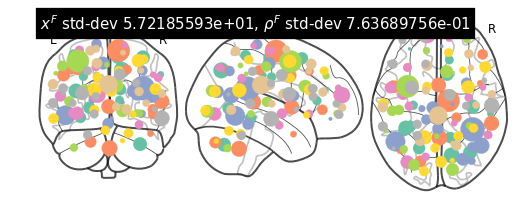

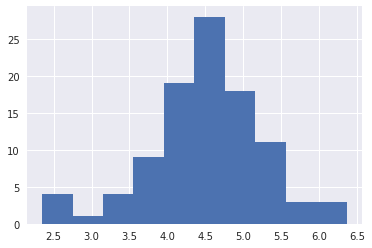

(<nilearn.plotting.displays.OrthoProjector at 0x7f8d80143a58>,
 tensor([[-36.2937, -44.7439,  57.7365],
         [ 55.0851, -26.2901,  36.7439],
         [-29.2906, -39.5154,  -8.3143],
         [-30.0495,  41.8642,  22.1572],
         [ 14.2633, -70.2969,  41.8042],
         [ 11.8277,  30.1912,   9.8387],
         [ 33.4468, -67.4232, -36.3683],
         [ 36.4158, -18.8082,  54.8823],
         [-20.0528, -62.6448,   1.9577],
         [ 12.7833, -51.5229,  20.9916],
         [-34.0422, -41.3634,  19.6224],
         [-26.1925, -17.4879,  34.9030],
         [  9.7043,  14.6164,  54.5579],
         [  0.4478,   3.8177,   3.1540],
         [ 46.8579,  36.0231,   0.3475],
         [-39.3111, -63.8920,  41.8097],
         [ 44.3994,   5.6143, -25.2879],
         [ 10.7496, -12.6796,  62.0295],
         [-32.1719,  22.3435,  40.7253],
         [  1.3094, -51.6431, -40.6835],
         [ 56.2103, -36.4435,   8.5972],
         [-47.0645,   2.0052,  36.3324],
         [ 19.3220, -30.3956,  42.0

In [7]:
dtfa.visualize_factor_embedding()

In [8]:
def task_labeler(task):
    if 'heights' in task:
        return 'Heights'
    elif 'social' in task:
        return 'Social threat'
    elif 'spider' in task:
        return 'Spiders'
    elif 'rest' in task:
        return 'Rest'
    else:
        return None

def rest_task_labeler(task):
    if task == 'rest':
        return 'Rest'
    else:
        return 'Task'

In [9]:
losses = dtfa.train(num_steps=1000, learning_rate={'q': 1e-2, 'p': 1e-4}, log_level=logging.INFO, num_particles=1,
                    batch_size=25, use_cuda=True, checkpoint_steps=100, blocks_batch_size=10, patience=100,
                    blocks_filter=affvids_db.inference_filter(training=True))

09/20/2019 18:46:50 [Epoch 1] (83544ms) Posterior free-energy 2.60956928e+09 = KL from prior 2.20237975e+06 - log-likelihood -2.60736717e+09
09/20/2019 18:46:50 Saving checkpoint...
09/20/2019 18:48:11 [Epoch 2] (79878ms) Posterior free-energy 2.41484365e+09 = KL from prior 1.59203300e+06 - log-likelihood -2.41325133e+09
09/20/2019 18:49:30 [Epoch 3] (78721ms) Posterior free-energy 2.31105382e+09 = KL from prior 1.22441550e+06 - log-likelihood -2.30982886e+09
09/20/2019 18:50:48 [Epoch 4] (78672ms) Posterior free-energy 2.26382438e+09 = KL from prior 8.67138750e+05 - log-likelihood -2.26295680e+09
09/20/2019 18:52:07 [Epoch 5] (78958ms) Posterior free-energy 2.23874970e+09 = KL from prior 6.37542250e+05 - log-likelihood -2.23811200e+09
09/20/2019 18:53:26 [Epoch 6] (78804ms) Posterior free-energy 2.22386202e+09 = KL from prior 5.59128125e+05 - log-likelihood -2.22330342e+09
09/20/2019 18:54:45 [Epoch 7] (78964ms) Posterior free-energy 2.21387392e+09 = KL from prior 5.43108750e+05 - log

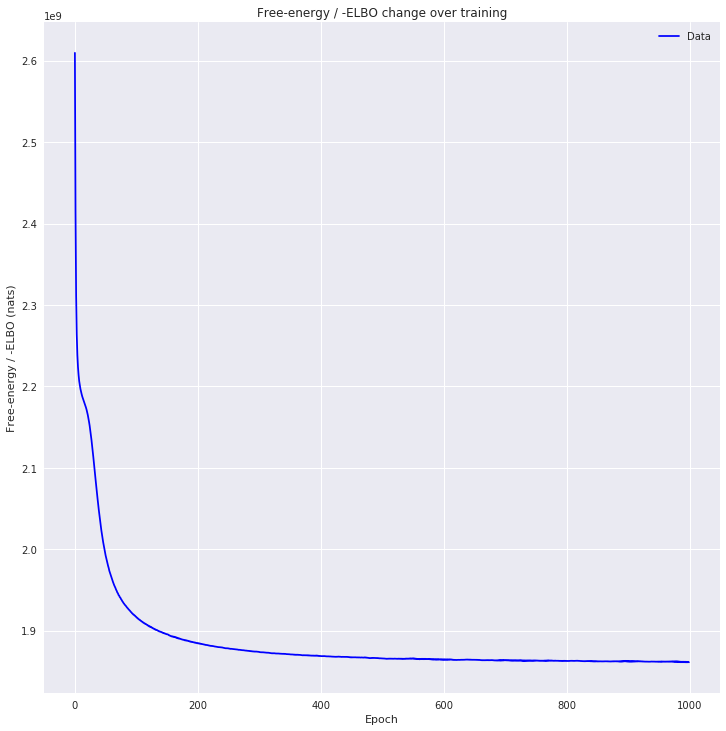

In [10]:
utils.plot_losses(losses)

In [11]:
losses_extra = dtfa.train(num_steps=1000, learning_rate={'q': 1e-2, 'p': 1e-4}, log_level=logging.INFO, num_particles=1,
                          batch_size=25, use_cuda=True, checkpoint_steps=100, blocks_batch_size=10, patience=100,
                          train_globals=False, blocks_filter=affvids_db.inference_filter(training=False))

09/21/2019 16:42:23 [Epoch 1] (3149ms) Posterior free-energy 1.30306568e+08 = KL from prior 1.30834102e+05 - log-likelihood -1.30175744e+08
09/21/2019 16:42:23 Saving checkpoint...
09/21/2019 16:42:27 [Epoch 2] (3049ms) Posterior free-energy 1.28605840e+08 = KL from prior 1.09077859e+05 - log-likelihood -1.28496776e+08
09/21/2019 16:42:30 [Epoch 3] (3039ms) Posterior free-energy 1.26957376e+08 = KL from prior 1.05439516e+05 - log-likelihood -1.26851928e+08
09/21/2019 16:42:33 [Epoch 4] (3017ms) Posterior free-energy 1.26331712e+08 = KL from prior 1.03804133e+05 - log-likelihood -1.26227912e+08
09/21/2019 16:42:36 [Epoch 5] (3017ms) Posterior free-energy 1.25429712e+08 = KL from prior 1.03111625e+05 - log-likelihood -1.25326592e+08
09/21/2019 16:42:39 [Epoch 6] (3006ms) Posterior free-energy 1.23805368e+08 = KL from prior 9.86378125e+04 - log-likelihood -1.23706720e+08
09/21/2019 16:42:42 [Epoch 7] (3026ms) Posterior free-energy 1.22473696e+08 = KL from prior 9.76508516e+04 - log-likeli

In [12]:
import torch

In [13]:
losses = torch.cat((torch.tensor(losses), torch.tensor(losses_extra)), dim=-1).numpy()

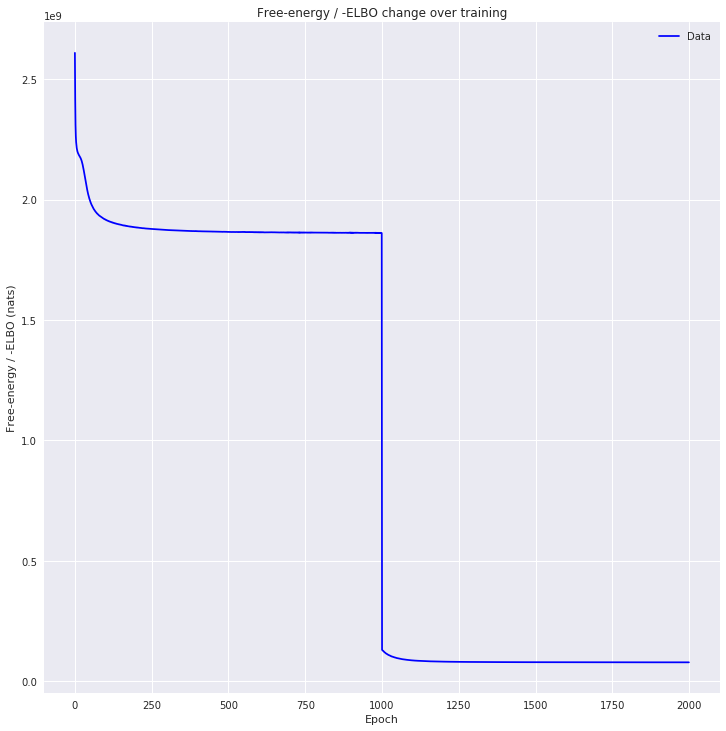

In [14]:
utils.plot_losses(losses)

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


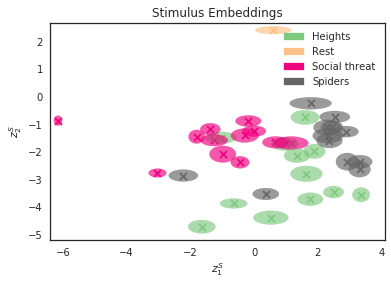

In [15]:
dtfa.scatter_task_embedding(labeler=task_labeler, figsize=None)

In [16]:
def subject_labeler(subject):
    return 'Subject %d' % subject

/home/eli/anaconda3/envs/HTFATorch/lib/python3.6/site-packages/matplotlib/figure.py:445: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  % get_backend())


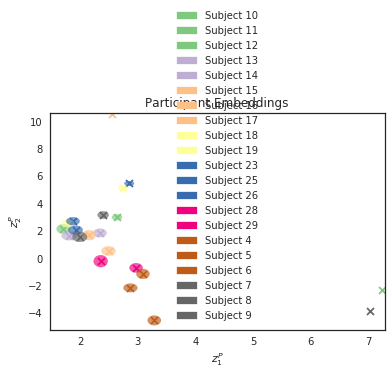

In [17]:
dtfa.scatter_subject_embedding(labeler=subject_labeler, figsize=None)

09/21/2019 17:33:31 Plotting factors for Participant 19, run 3


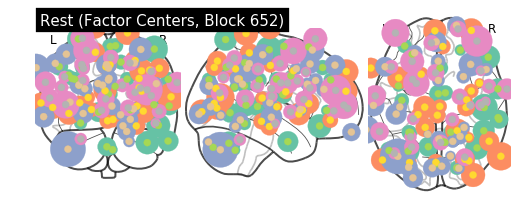

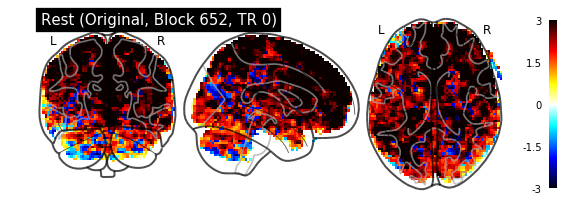

09/21/2019 17:33:38 Reconstruction Error (Frobenius Norm): 1.18444275e+03 out of 1.50325134e+03


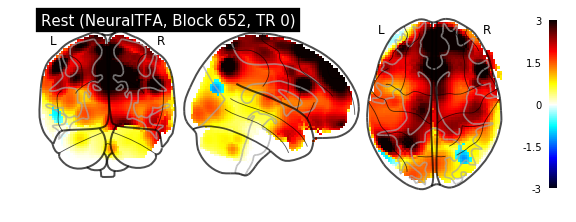

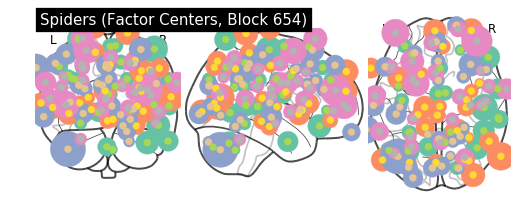

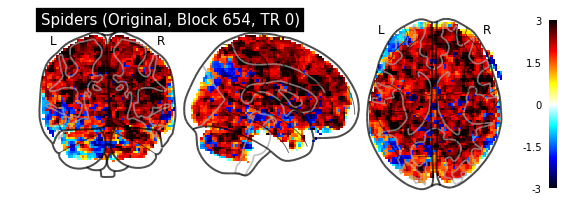

09/21/2019 17:33:43 Reconstruction Error (Frobenius Norm): 1.13019592e+03 out of 1.33472974e+03


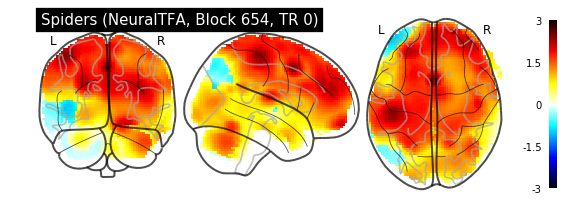

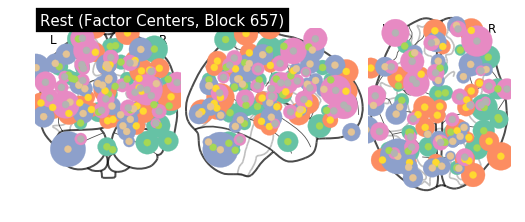

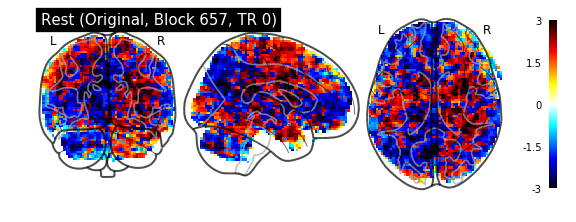

09/21/2019 17:33:49 Reconstruction Error (Frobenius Norm): 1.19367517e+03 out of 1.38643933e+03


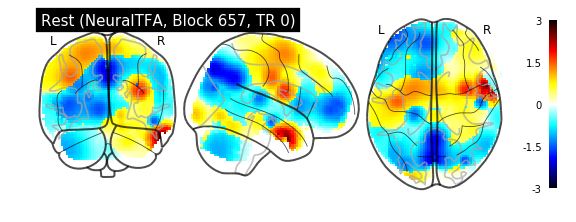

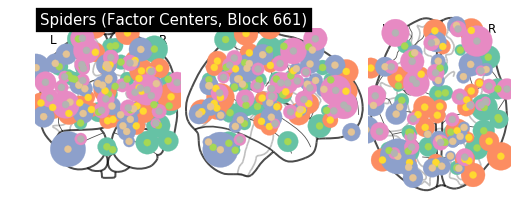

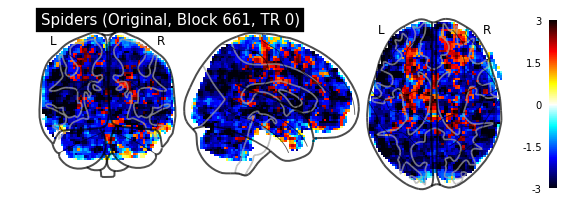

09/21/2019 17:33:54 Reconstruction Error (Frobenius Norm): 1.17008081e+03 out of 1.44549939e+03


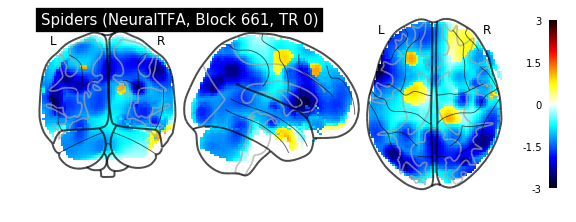

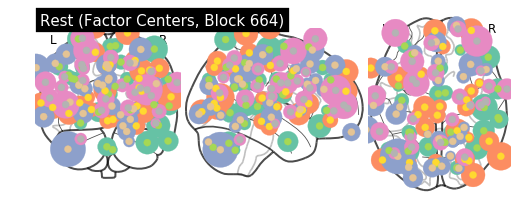

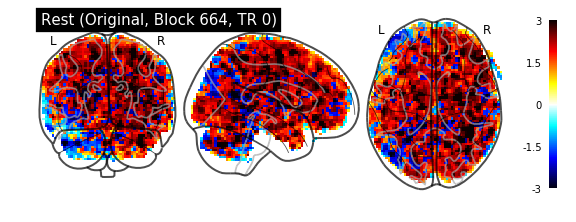

09/21/2019 17:33:59 Reconstruction Error (Frobenius Norm): 1.10896545e+03 out of 1.32311792e+03


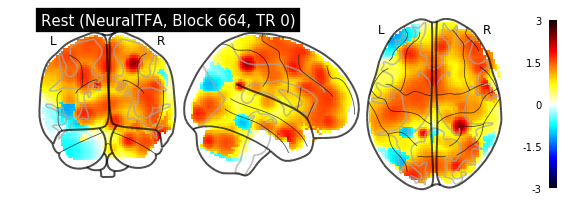

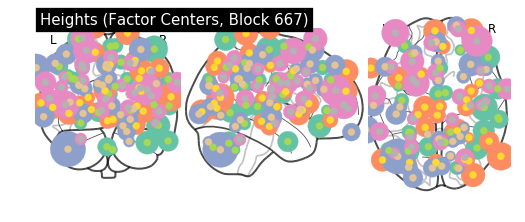

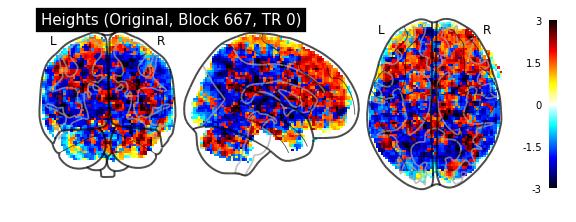

09/21/2019 17:34:04 Reconstruction Error (Frobenius Norm): 1.05908728e+03 out of 1.22364941e+03


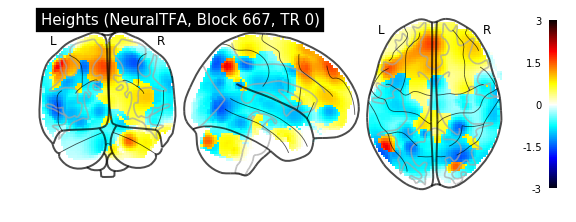

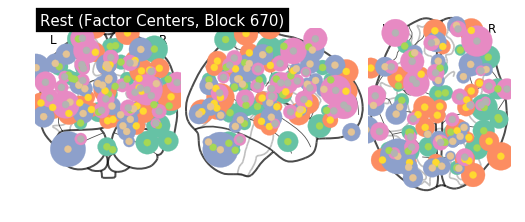

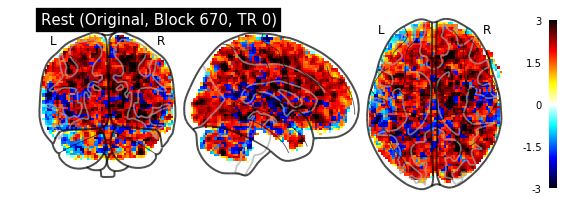

09/21/2019 17:34:09 Reconstruction Error (Frobenius Norm): 9.99882446e+02 out of 1.16354187e+03


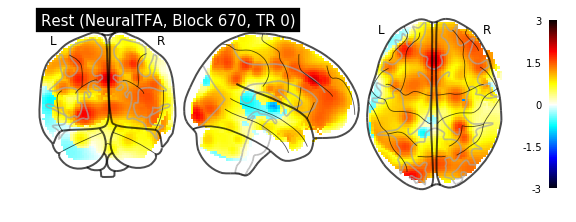

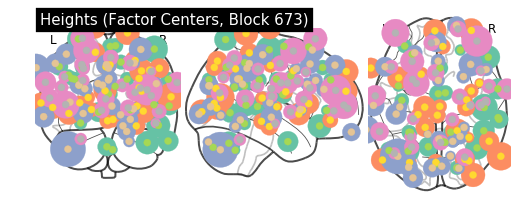

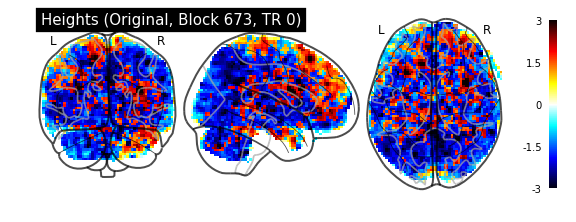

09/21/2019 17:34:14 Reconstruction Error (Frobenius Norm): 1.00185651e+03 out of 1.16893665e+03


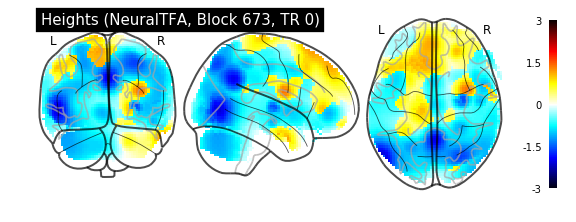

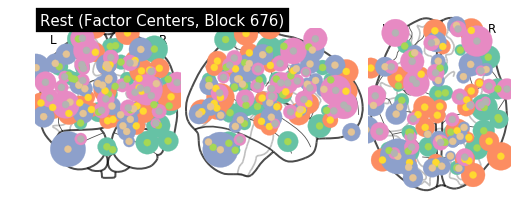

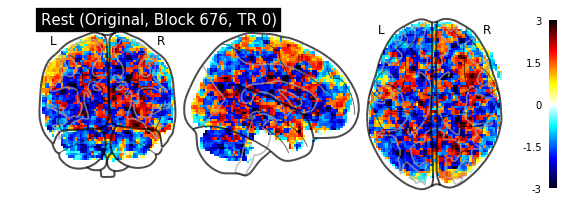

09/21/2019 17:34:20 Reconstruction Error (Frobenius Norm): 1.06754663e+03 out of 1.18695398e+03


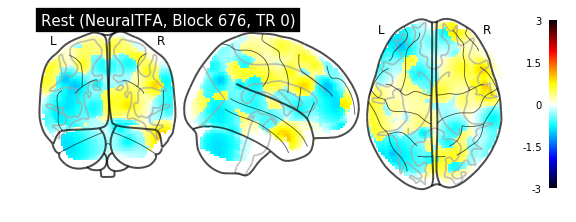

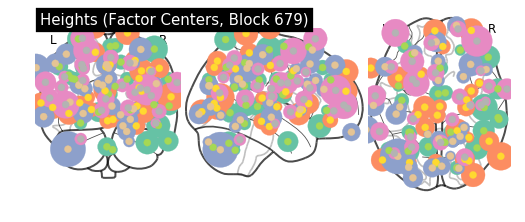

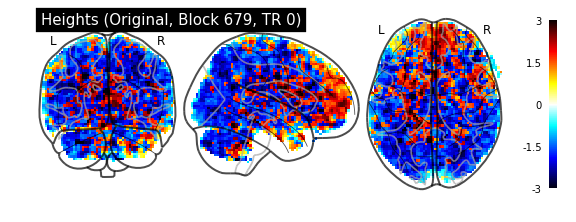

09/21/2019 17:34:25 Reconstruction Error (Frobenius Norm): 1.05468079e+03 out of 1.19020508e+03


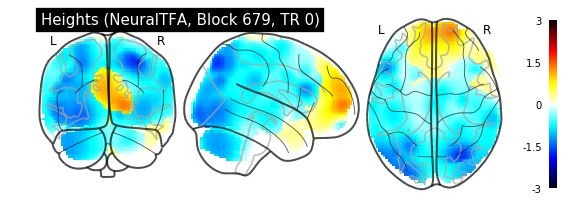

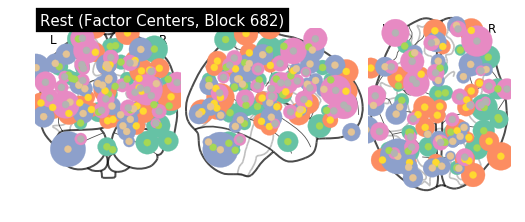

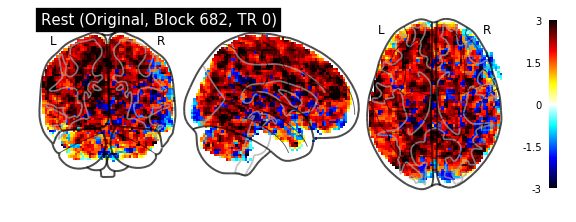

09/21/2019 17:34:30 Reconstruction Error (Frobenius Norm): 1.17467041e+03 out of 1.49755591e+03


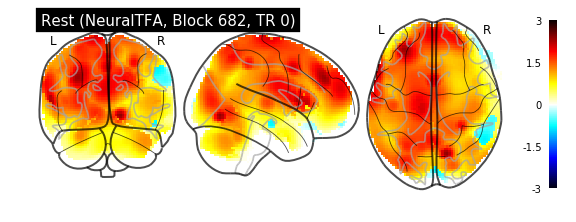

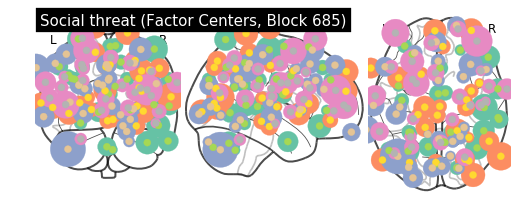

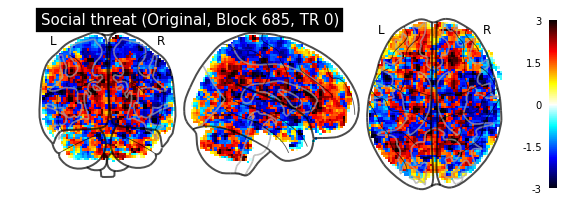

09/21/2019 17:34:35 Reconstruction Error (Frobenius Norm): 1.03259082e+03 out of 1.24858765e+03


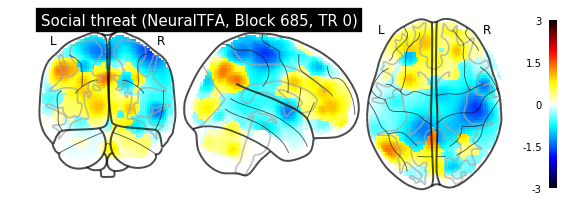

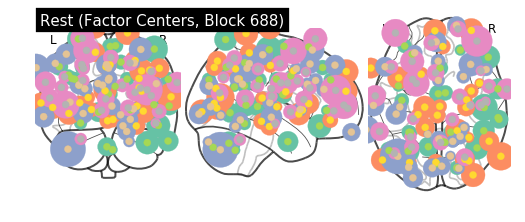

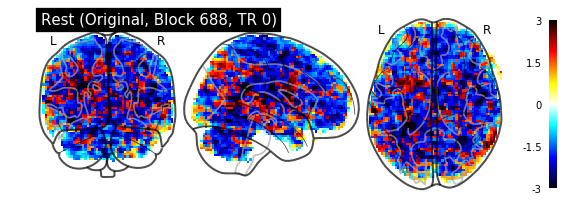

09/21/2019 17:34:41 Reconstruction Error (Frobenius Norm): 1.04053674e+03 out of 1.16377527e+03


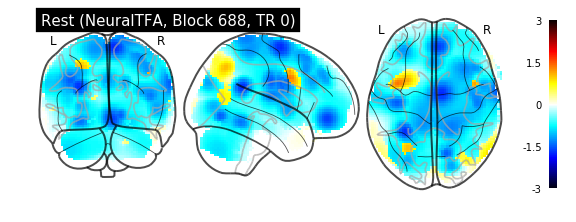

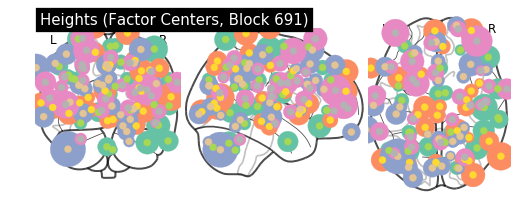

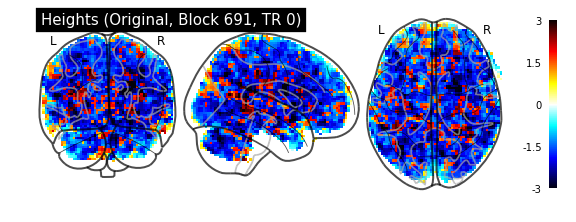

09/21/2019 17:34:46 Reconstruction Error (Frobenius Norm): 1.04847046e+03 out of 1.20309143e+03


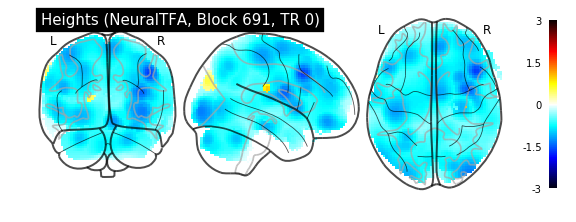

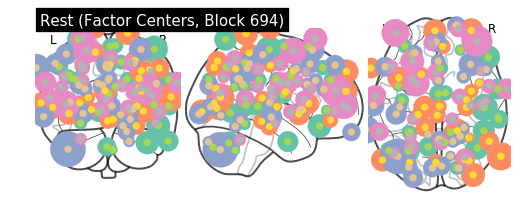

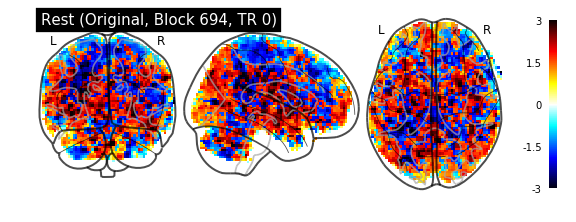

09/21/2019 17:34:51 Reconstruction Error (Frobenius Norm): 1.05936377e+03 out of 1.16525000e+03


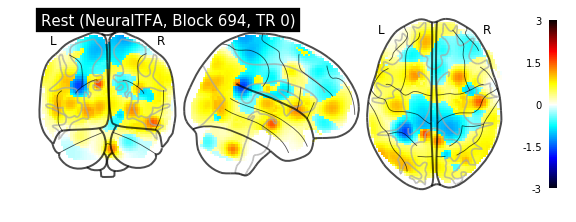

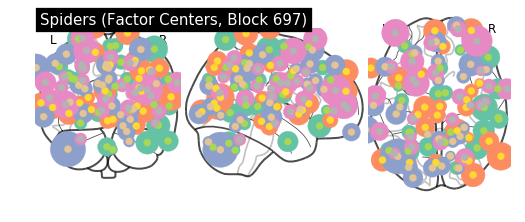

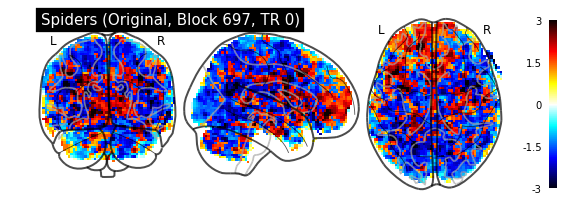

09/21/2019 17:34:56 Reconstruction Error (Frobenius Norm): 1.03569226e+03 out of 1.18719519e+03


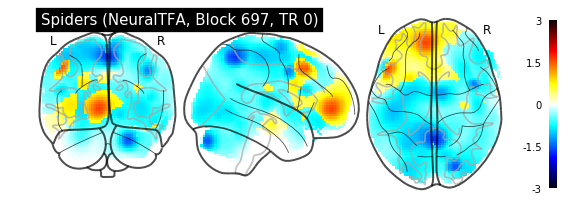

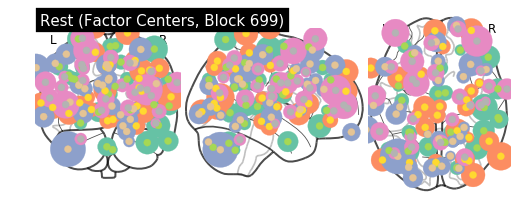

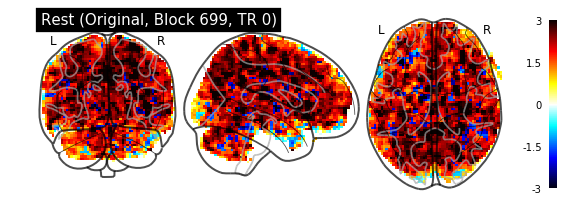

09/21/2019 17:35:01 Reconstruction Error (Frobenius Norm): 1.03772388e+03 out of 1.19054749e+03


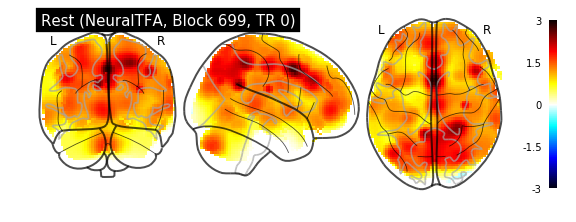

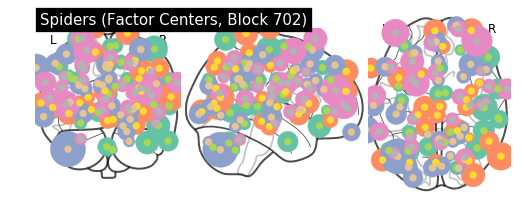

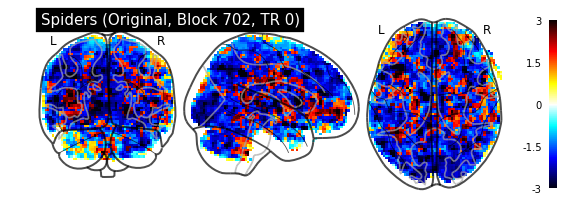

09/21/2019 17:35:06 Reconstruction Error (Frobenius Norm): 1.08066614e+03 out of 1.27696851e+03


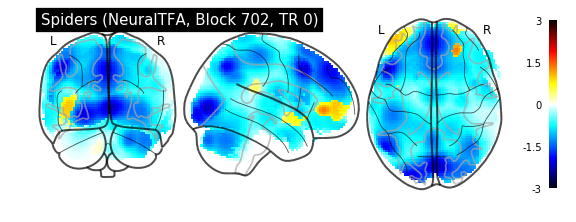

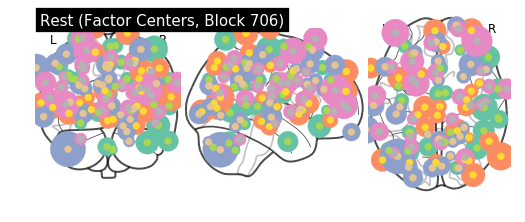

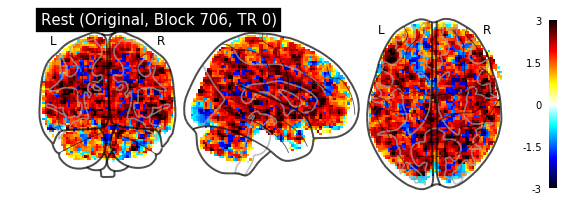

09/21/2019 17:35:12 Reconstruction Error (Frobenius Norm): 1.16281628e+03 out of 1.52176587e+03


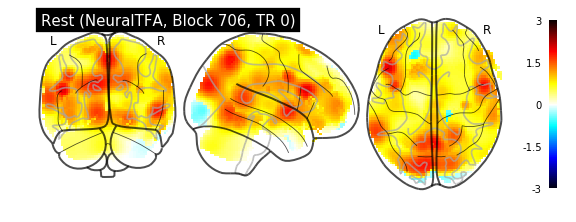

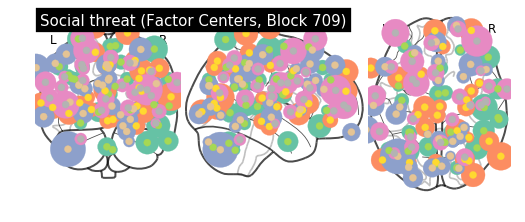

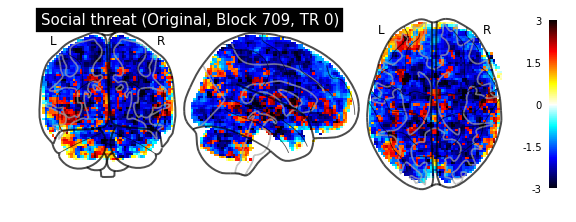

09/21/2019 17:35:17 Reconstruction Error (Frobenius Norm): 1.07534363e+03 out of 1.31859497e+03


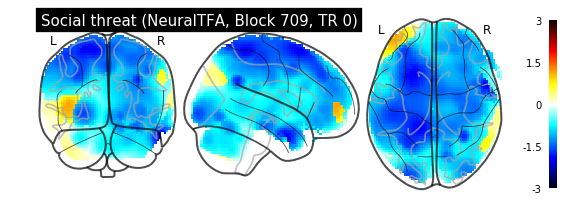

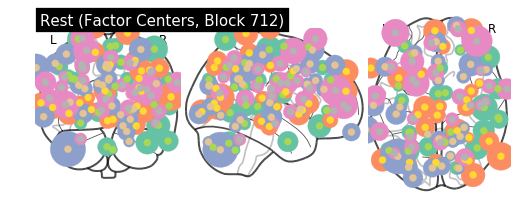

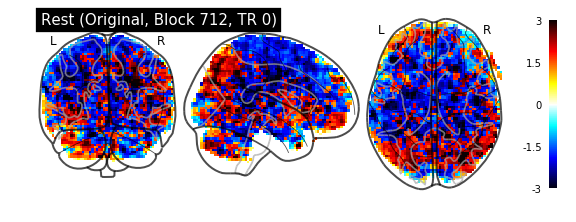

09/21/2019 17:35:22 Reconstruction Error (Frobenius Norm): 1.08690796e+03 out of 1.30022961e+03


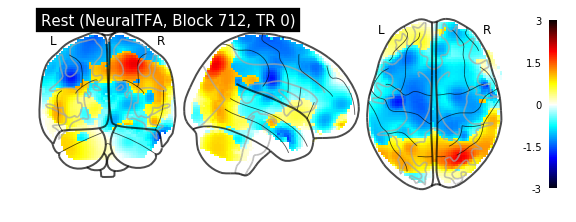

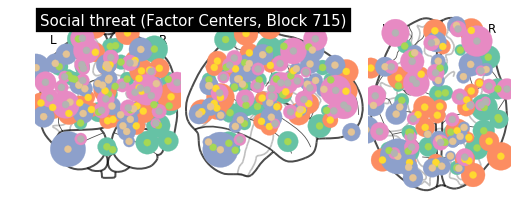

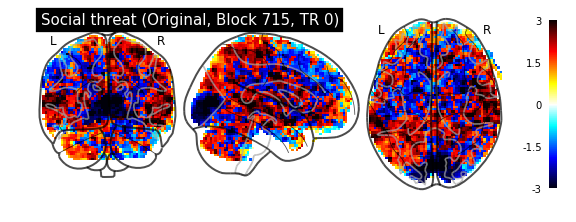

09/21/2019 17:35:27 Reconstruction Error (Frobenius Norm): 1.07478259e+03 out of 1.35051099e+03


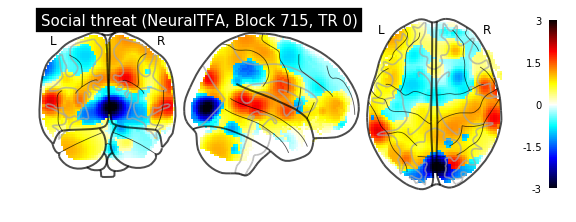

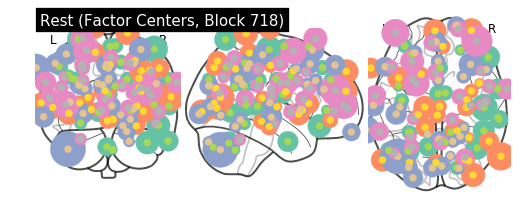

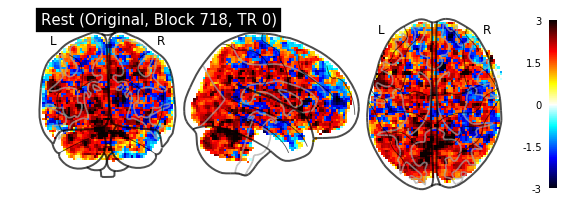

09/21/2019 17:35:32 Reconstruction Error (Frobenius Norm): 1.05536096e+03 out of 1.20784363e+03


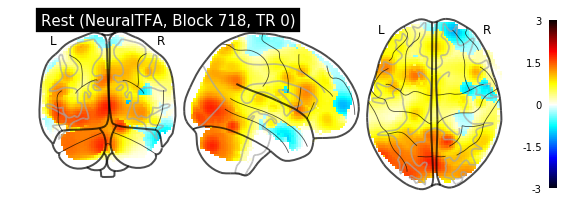

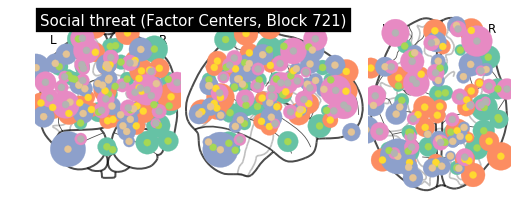

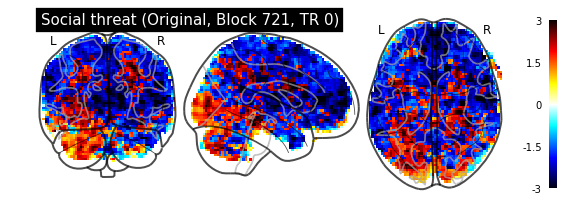

09/21/2019 17:35:37 Reconstruction Error (Frobenius Norm): 1.15562488e+03 out of 1.42390442e+03


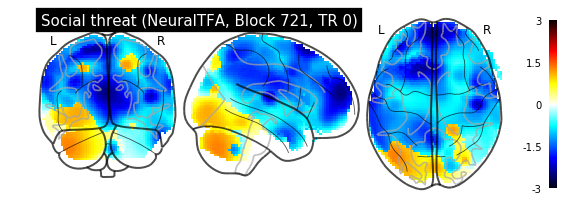

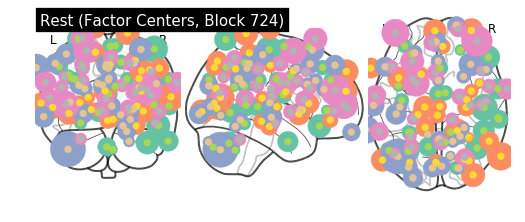

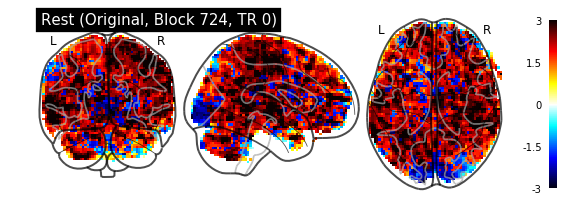

09/21/2019 17:35:43 Reconstruction Error (Frobenius Norm): 1.26214758e+03 out of 1.66302002e+03


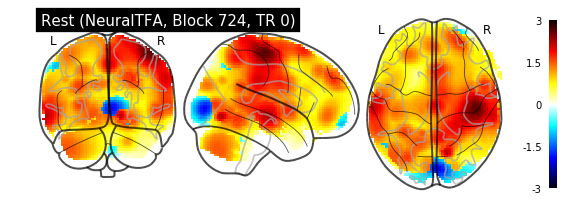

In [18]:
subject_runs = set([(block.subject, block.run) for block in dtfa._blocks])

for i in np.random.choice(range(len(subject_runs)), 1):
    subject, run = list(subject_runs)[i]
    logging.info('Plotting factors for Participant %d, run %d' % (subject, run))
    blocks = [block for block in dtfa._blocks if block.subject == subject and block.run == run]
    blocks.sort(key=lambda b: b.start_time)
    for block in blocks:
        index = dtfa._blocks.index(block)
        dtfa.plot_factor_centers(index, labeler=lambda b: task_labeler(b.task))
        dtfa.plot_original_brain(index, labeler=lambda b: task_labeler(b.task))
        dtfa.plot_reconstruction(index, labeler=lambda b: task_labeler(b.task))


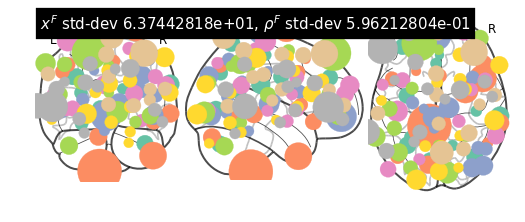

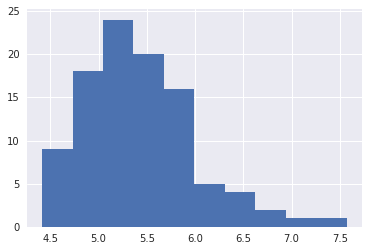

(<nilearn.plotting.displays.OrthoProjector at 0x7f8ac425e400>,
 tensor([[-32.1744, -59.5871,  70.5182],
         [ 64.8821, -28.7538,  26.7823],
         [-28.1185, -55.3107, -14.6994],
         [-37.4957,  44.0133,  34.3362],
         [  1.1252, -71.0370,  39.0325],
         [  1.4470,  35.3361,   7.9579],
         [ 38.5661, -71.7161, -35.7814],
         [ 40.1459, -23.5373,  57.9913],
         [ -8.2319, -76.0273,   0.7491],
         [ 15.2578, -59.8774,  21.7766],
         [-28.8029, -51.2582,  17.6986],
         [-33.2780,  -7.4378,  35.0367],
         [ -2.1089,  26.3972,  30.1837],
         [  1.7162,  13.5057,   5.7041],
         [ 47.8089,  26.5615, -12.1689],
         [-42.6037, -71.3177,  47.2422],
         [ 47.0706,  10.7446, -48.5030],
         [ 28.8248,  -1.8750,  85.1556],
         [-23.1529,  18.5011,  53.7738],
         [ -9.1911, -39.2052, -64.6343],
         [ 65.2863, -36.1229,  -4.1677],
         [-48.3264,  10.3586,  39.8522],
         [  5.5941, -37.1284,  50.6

In [19]:
dtfa.visualize_factor_embedding()

In [20]:
dtfa.average_reconstruction_error()

09/21/2019 17:37:16 Average reconstruction error (MSE): 8.38449491e-01
09/21/2019 17:37:16 Average data norm (Euclidean): 9.99668052e-01
09/21/2019 17:37:16 Percent average reconstruction error: 0.299664


(0.8384494910481854, 0.9996680517728069, 0.002996637771964297)

In [21]:
dtfa.average_reconstruction_error(weighted=False)

09/21/2019 17:38:40 Average reconstruction error (MSE): 1.09652829e+03 +/- 1.02493047e+02
09/21/2019 17:38:40 Average data norm (Euclidean): 1.30250591e+03 +/- 1.67479200e+02
09/21/2019 17:38:40 Percent average reconstruction error: 84.614391 +/- 5.26458309e+00


(array([1323.42944336, 1366.58935547, 1223.23718262, ..., 1389.56921387,
        1300.67980957, 1305.94470215]),
 array([1488.00500488, 1612.47546387, 1375.78967285, ..., 1595.11547852,
        1510.71850586, 1530.75769043]),
 array([0.88939852, 0.84751017, 0.88911642, ..., 0.8711402 , 0.86096768,
        0.85313614]))